In [1]:
import sys
sys.path.append('../')
import os
import random
from datasets import load_dataset, Dataset
from tqdm import tqdm
import polars as pl
from concurrent.futures import ProcessPoolExecutor
import spacy
import numpy as np
from functools import partial
import re
from PIL import Image
import torch
import matplotlib.pyplot as plt

import torchvision
from torchvision.transforms.functional import InterpolationMode
from transformers import AutoTokenizer, AutoProcessor, AutoModelForSeq2SeqLM, AutoModel
import diffusers
from diffusers.image_processor import VaeImageProcessor
from diffusers import AutoencoderKL, DDPMScheduler

from model.model import DiT_Llama
from model.trainer import Trainer

pl.Config.set_fmt_str_lengths(200)

/home/enric/projects/tiny_diffusion/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


polars.config.Config

In [2]:
PATH = '/mnt/sd1tb/tinydiffusion/dataset_v0/'
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
torch.cuda.empty_cache()

In [3]:
import random
random.random()

0.1173296174652313

In [4]:
from typing import Any
from model.trainer import Trainer
class TinyDiffusionPipeline:
    def __init__(
        self, 
        path_ckpt: str,
        tokenizer: None|AutoTokenizer=None, 
        text_encoder: None|AutoModelForSeq2SeqLM=None,
        device: None|str="cuda"
    ):
        with torch.inference_mode():
            model = Trainer.load_from_checkpoint(path_ckpt)
            if model is not None:
                self.model = model.to(device)
                self.vae = model.vae.to(device)
                self.scheduler = model.noise_scheduler
            self.tokenizer = tokenizer
            self.tokenizer.pad_token = self.tokenizer.bos_token
            self.text_encoder = text_encoder.to(device)


    def prep_text_embeddings(self, text: list[str]):
        if self.tokenizer is None:
            raise ValueError("Tokenizer does not exists")
        caption = self.tokenizer(
            text, 
            truncation=True,
            max_length=77*3, 
            padding="max_length", 
            return_tensors="pt"
        ) #type: ignore
        caption['attention_mask'] = caption["attention_mask"].unsqueeze(0)
        t5_inputs = {k: v.to(DEVICE) for k, v in caption.items()}
        with torch.cuda.amp.autocast(), torch.inference_mode():
            t5_outputs = self.text_encoder.encoder(**t5_inputs)[0]
        t5_mask = t5_inputs["attention_mask"].permute(0, 2, 1).expand(t5_outputs.shape)
        t5_pool = (t5_outputs * t5_mask).sum(1) / t5_mask.sum(dim=1)
        return t5_pool 

    
    def __call__(
        self,
        num_images: int=1,
        num_inference_steps: int=20,
        cfg_scale: int=1,
        seed: None|int=None
    ):
        if seed:
            seed = torch.manual_seed(seed)
        self.scheduler.set_timesteps(num_inference_steps=num_steps)


# pipe = TinyDiffusionPipeline(
#     path_ckpt='/home/enric/projects/tiny_diffusion/logs/2024_07_21-12_52_34/epoch=9-step=21140.ckpt',
#     tokenizer=AutoTokenizer.from_pretrained("EleutherAI/pile-t5-base", use_fast=True),
#     text_encoder=AutoModelForSeq2SeqLM.from_pretrained("EleutherAI/pile-t5-base", torch_dtype=torch.float16),
#     device=DEVICE
# )

In [5]:
# model = DiT_Llama(
#     in_channels=16, input_size=32, patch_size=2, 
#     dim=512, n_layers=16, n_heads=32
# ).to(DEVICE)
# model.load_state_dict(torch.load('/home/enric/projects/tiny_diffusion/logs/2024_07_21-12_52_34/epoch=9-step=21140.ckpt')['state_dict'])
model = Trainer.load_from_checkpoint('/home/enric/projects/tiny_diffusion/logs/2024_08_01-01_02_15/epoch=49-step=265250.ckpt').to(DEVICE)
# model = Trainer()
_ = model.eval()
t5model = AutoModelForSeq2SeqLM.from_pretrained("EleutherAI/pile-t5-base", torch_dtype=torch.float16).to(DEVICE)
t5model.requires_grad_(False)
tokenizer = AutoTokenizer.from_pretrained("EleutherAI/pile-t5-base", use_fast=True)
tokenizer.pad_token = tokenizer.bos_token

/home/enric/projects/tiny_diffusion/.venv/lib/python3.12/site-packages/lightning/fabric/utilities/cloud_io.py:57: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


positional_encoding - 98304
register_tokens - 3072
init_x_linear.weight - 24576
x_embedder.weight - 294912
t_embedder.mlp.0.weight - 98304
t_embedder.mlp.0.bias - 384
t_embedder.mlp.2.weight - 147456
t_embedder.mlp.2.bias - 384
cap_embedder.weight - 294912
layers.0.mlpC.c_fc1.weight - 393216
layers.0.mlpC.c_fc2.weight - 393216
layers.0.mlpC.c_proj.weight - 393216
layers.0.modC.1.weight - 884736
layers.0.mlpX.c_fc1.weight - 393216
layers.0.mlpX.c_fc2.weight - 393216
layers.0.mlpX.c_proj.weight - 393216
layers.0.modX.1.weight - 884736
layers.0.attn.w1q.weight - 147456
layers.0.attn.w1k.weight - 147456
layers.0.attn.w1v.weight - 147456
layers.0.attn.w1o.weight - 147456
layers.0.attn.w2q.weight - 147456
layers.0.attn.w2k.weight - 147456
layers.0.attn.w2v.weight - 147456
layers.0.attn.w2o.weight - 147456
layers.1.mlpC.c_fc1.weight - 393216
layers.1.mlpC.c_fc2.weight - 393216
layers.1.mlpC.c_proj.weight - 393216
layers.1.modC.1.weight - 884736
layers.1.mlpX.c_fc1.weight - 393216
layers.1.mlp

RuntimeError: Error(s) in loading state_dict for Trainer:
	Unexpected key(s) in state_dict: "model.init_x_linear.bias". 
	size mismatch for model.positional_encoding: copying a param with shape torch.Size([1, 256, 528]) from checkpoint, the shape in current model is torch.Size([1, 256, 384]).
	size mismatch for model.register_tokens: copying a param with shape torch.Size([1, 8, 528]) from checkpoint, the shape in current model is torch.Size([1, 8, 384]).
	size mismatch for model.init_x_linear.weight: copying a param with shape torch.Size([528, 64]) from checkpoint, the shape in current model is torch.Size([384, 64]).
	size mismatch for model.x_embedder.weight: copying a param with shape torch.Size([528, 1056]) from checkpoint, the shape in current model is torch.Size([384, 768]).
	size mismatch for model.t_embedder.mlp.0.weight: copying a param with shape torch.Size([528, 256]) from checkpoint, the shape in current model is torch.Size([384, 256]).
	size mismatch for model.t_embedder.mlp.0.bias: copying a param with shape torch.Size([528]) from checkpoint, the shape in current model is torch.Size([384]).
	size mismatch for model.t_embedder.mlp.2.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.t_embedder.mlp.2.bias: copying a param with shape torch.Size([528]) from checkpoint, the shape in current model is torch.Size([384]).
	size mismatch for model.cap_embedder.weight: copying a param with shape torch.Size([528, 768]) from checkpoint, the shape in current model is torch.Size([384, 768]).
	size mismatch for model.layers.0.mlpC.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.0.mlpC.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.0.mlpC.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.0.modC.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.0.mlpX.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.0.mlpX.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.0.mlpX.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.0.modX.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.0.attn.w1q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.0.attn.w1k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.0.attn.w1v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.0.attn.w1o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.0.attn.w2q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.0.attn.w2k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.0.attn.w2v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.0.attn.w2o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.1.mlpC.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.1.mlpC.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.1.mlpC.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.1.modC.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.1.mlpX.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.1.mlpX.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.1.mlpX.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.1.modX.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.1.attn.w1q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.1.attn.w1k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.1.attn.w1v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.1.attn.w1o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.1.attn.w2q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.1.attn.w2k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.1.attn.w2v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.1.attn.w2o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.2.mlpC.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.2.mlpC.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.2.mlpC.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.2.modC.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.2.mlpX.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.2.mlpX.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.2.mlpX.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.2.modX.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.2.attn.w1q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.2.attn.w1k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.2.attn.w1v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.2.attn.w1o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.2.attn.w2q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.2.attn.w2k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.2.attn.w2v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.2.attn.w2o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.3.mlpC.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.3.mlpC.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.3.mlpC.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.3.modC.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.3.mlpX.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.3.mlpX.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.3.mlpX.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.3.modX.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.3.attn.w1q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.3.attn.w1k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.3.attn.w1v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.3.attn.w1o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.3.attn.w2q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.3.attn.w2k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.3.attn.w2v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.3.attn.w2o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.4.mlpC.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.4.mlpC.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.4.mlpC.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.4.modC.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.4.mlpX.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.4.mlpX.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.4.mlpX.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.4.modX.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.4.attn.w1q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.4.attn.w1k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.4.attn.w1v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.4.attn.w1o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.4.attn.w2q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.4.attn.w2k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.4.attn.w2v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.4.attn.w2o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.5.mlpC.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.5.mlpC.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.5.mlpC.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.5.modC.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.5.mlpX.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.5.mlpX.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.5.mlpX.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.5.modX.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.5.attn.w1q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.5.attn.w1k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.5.attn.w1v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.5.attn.w1o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.5.attn.w2q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.5.attn.w2k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.5.attn.w2v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.5.attn.w2o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.6.mlpC.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.6.mlpC.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.6.mlpC.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.6.modC.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.6.mlpX.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.6.mlpX.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.6.mlpX.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.6.modX.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.6.attn.w1q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.6.attn.w1k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.6.attn.w1v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.6.attn.w1o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.6.attn.w2q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.6.attn.w2k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.6.attn.w2v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.6.attn.w2o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.7.mlpC.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.7.mlpC.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.7.mlpC.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.7.modC.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.7.mlpX.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.7.mlpX.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.7.mlpX.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.7.modX.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.7.attn.w1q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.7.attn.w1k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.7.attn.w1v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.7.attn.w1o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.7.attn.w2q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.7.attn.w2k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.7.attn.w2v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.7.attn.w2o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.8.mlpC.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.8.mlpC.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.8.mlpC.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.8.modC.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.8.mlpX.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.8.mlpX.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.8.mlpX.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.8.modX.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.8.attn.w1q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.8.attn.w1k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.8.attn.w1v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.8.attn.w1o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.8.attn.w2q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.8.attn.w2k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.8.attn.w2v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.8.attn.w2o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.9.mlpC.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.9.mlpC.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.9.mlpC.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.9.modC.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.9.mlpX.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.9.mlpX.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.9.mlpX.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.9.modX.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.9.attn.w1q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.9.attn.w1k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.9.attn.w1v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.9.attn.w1o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.9.attn.w2q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.9.attn.w2k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.9.attn.w2v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.9.attn.w2o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.10.mlpC.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.10.mlpC.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.10.mlpC.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.10.modC.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.10.mlpX.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.10.mlpX.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.10.mlpX.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.10.modX.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.10.attn.w1q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.10.attn.w1k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.10.attn.w1v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.10.attn.w1o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.10.attn.w2q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.10.attn.w2k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.10.attn.w2v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.10.attn.w2o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.11.mlpC.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.11.mlpC.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.11.mlpC.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.11.modC.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.11.mlpX.c_fc1.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.11.mlpX.c_fc2.weight: copying a param with shape torch.Size([1536, 528]) from checkpoint, the shape in current model is torch.Size([1024, 384]).
	size mismatch for model.layers.11.mlpX.c_proj.weight: copying a param with shape torch.Size([528, 1536]) from checkpoint, the shape in current model is torch.Size([384, 1024]).
	size mismatch for model.layers.11.modX.1.weight: copying a param with shape torch.Size([3168, 528]) from checkpoint, the shape in current model is torch.Size([2304, 384]).
	size mismatch for model.layers.11.attn.w1q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.11.attn.w1k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.11.attn.w1v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.11.attn.w1o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.11.attn.w2q.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.11.attn.w2k.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.11.attn.w2v.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.layers.11.attn.w2o.weight: copying a param with shape torch.Size([528, 528]) from checkpoint, the shape in current model is torch.Size([384, 384]).
	size mismatch for model.final_layer.linear.weight: copying a param with shape torch.Size([64, 528]) from checkpoint, the shape in current model is torch.Size([64, 384]).
	size mismatch for model.final_layer.adaLN_modulation.1.weight: copying a param with shape torch.Size([1056, 528]) from checkpoint, the shape in current model is torch.Size([768, 384]).

# Condition - No Scale 

In [5]:
bs = 1
caption = [
    'A dog playing on a garden'
]
cond_caption = tokenizer(
    caption, 
    truncation=True,
    max_length=77*3, 
    padding="max_length", 
    return_tensors="pt"
)
# max_length = cond_caption.input_ids.shape[-1]
# uncond_caption = tokenizer(
#     [""]*bs, 
#     truncation=True,
#     max_length=max_length, 
#     padding="max_length", 
#     return_tensors="pt"
# )
cond_caption['attention_mask'] = cond_caption["attention_mask"].unsqueeze(0)
# uncond_caption['attention_mask'] = uncond_caption["attention_mask"].unsqueeze(0)

cond_t5_inputs = {k: v.to(DEVICE) for k, v in cond_caption.items()}
# uncond_t5_inputs = {k: v.to(DEVICE) for k, v in uncond_caption.items()}
with torch.cuda.amp.autocast(), torch.inference_mode():
    cond_t5_outputs = t5model.encoder(**cond_t5_inputs)[0]
    # uncond_t5_outputs = t5model.encoder(**uncond_t5_inputs)[0]

cond_t5_mask = cond_t5_inputs["attention_mask"].permute(0, 2, 1).expand(cond_t5_outputs.shape)
cond_t5 = (cond_t5_outputs * cond_t5_mask).float().to(DEVICE)#.cpu()
# uncond_t5_mask = uncond_t5_inputs["attention_mask"].permute(0, 2, 1).expand(uncond_t5_outputs.shape)
cond_t5_pool = (cond_t5_outputs * cond_t5_mask).sum(1) / cond_t5_mask.sum(dim=1)
# uncond_t5_pool = (uncond_t5_outputs * uncond_t5_mask).sum(1) / uncond_t5_mask.sum(dim=1)
# text_embeddings = torch.cat([uncond_t5_pool, cond_t5_pool])

/tmp/ipykernel_180401/797100750.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(), torch.inference_mode():


In [6]:
# from model.model import DiT_Llama


# model = DiT_Llama(
#     in_channels=16, input_size=32, patch_size=2, 
#     dim=768, n_layers=12, n_heads=12
# ).to(DEVICE)

# cond_t5 = (cond_t5_outputs * cond_t5_mask).float().to(DEVICE)#.cpu()
# x = torch.randn(1, 16, 32, 32).to(DEVICE)
# t = torch.tensor([1.]).to(DEVICE)
# # cond_t5_pool = cond_t5_pool.to(DEVICE)
# # print(cond_t5.shape, cond_t5.device, cond_t5.dtype)
# with torch.cuda.amp.autocast():
#     _=model(x, t, cond_t5)
#     print('==='*20)
#     # _model(x, t, cond_t5)

In [7]:
num_steps = 35
scheduler = model.noise_scheduler
scheduler.set_timesteps(num_inference_steps=num_steps)
x = torch.randn(1, 16, 32, 32).to(DEVICE)
list_imgs = []
for i, t in tqdm(enumerate(scheduler.timesteps)):
    x = x.to(DEVICE)
    t = t.unsqueeze(0).to(DEVICE)
    latent = model.noise_scheduler.scale_model_input(x, timestep=t)
    with torch.cuda.amp.autocast(), torch.inference_mode():
        noise_pred = model(latent, t, cond_t5)
    x = scheduler.step(noise_pred.cpu(), t.cpu(), x.cpu()).prev_sample
    with torch.cuda.amp.autocast():
        img = model.vae.decode(x.to(DEVICE) / (model.vae_scaling_factor*1)).sample
    img = VaeImageProcessor().postprocess(
        image=img, do_denormalize=[True, True]
    )[0] # type: ignore
    list_imgs.append(img)

0it [00:00, ?it/s]/tmp/ipykernel_180401/202269317.py:10: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(), torch.inference_mode():
/tmp/ipykernel_180401/202269317.py:13: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
1it [00:11, 11.02s/it]/tmp/ipykernel_180401/202269317.py:10: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(), torch.inference_mode():
35it [00:11,  2.99it/s]


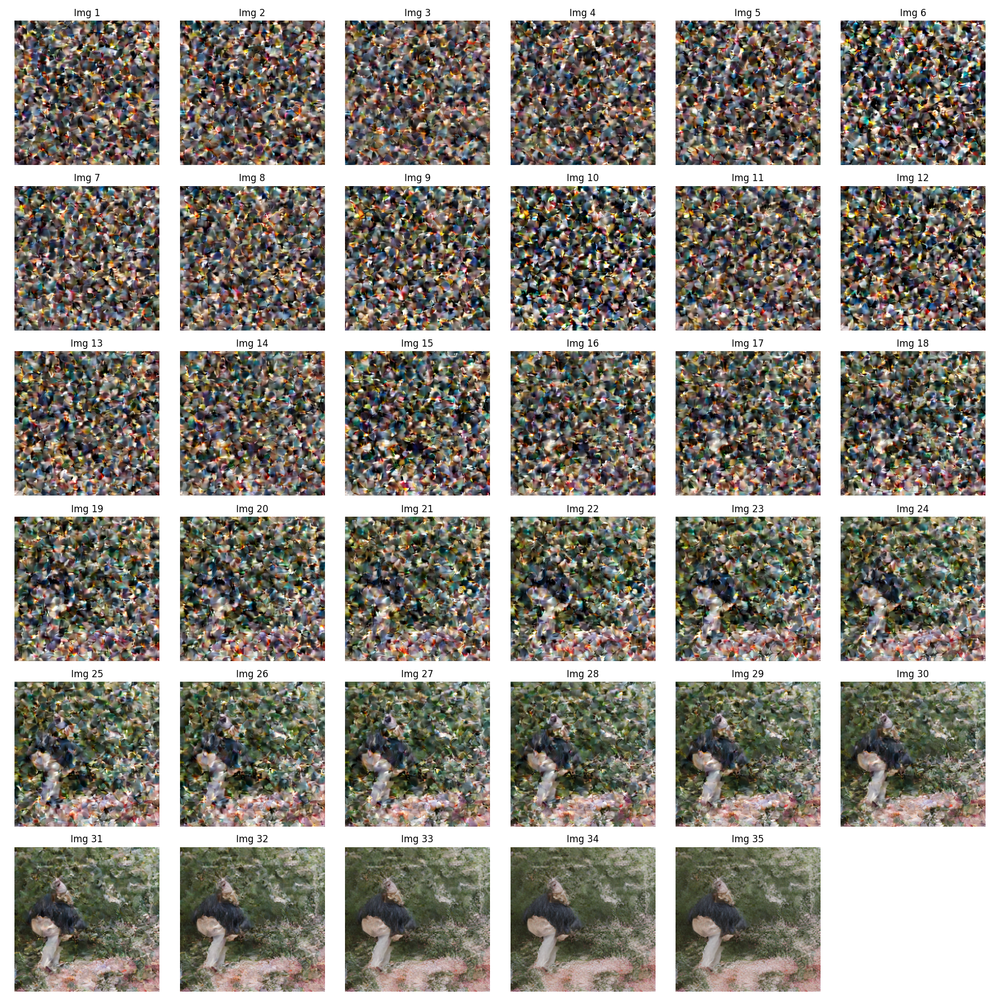

In [8]:
import math
from io import BytesIO
def show_imgs_grid(imgs):
    num_imgs = len(imgs)
    filas = math.ceil(math.sqrt(num_imgs))
    columnas = math.ceil(num_imgs / filas)
    
    # Crear la figura y los ejes
    fig, axes = plt.subplots(filas, columnas, figsize=(columnas * 3, filas * 3))
    axes = axes.flatten()

    for i in range(len(axes)):
        if i < num_imgs:
            axes[i].imshow(imgs[i])
            axes[i].set_title(f'Img {i + 1}')
        else:
            # Si hay más ejes que imágenes, ocultar los ejes adicionales
            axes[i].axis('off')
        axes[i].axis('off')

    plt.tight_layout()
    
    # Guardar la figura en un objeto BytesIO
    buf = BytesIO()
    plt.savefig(buf, format='png')
    buf.seek(0)
    
    # Cerrar la figura de Matplotlib
    plt.close(fig)
    
    # Crear una imagen PIL desde el objeto BytesIO
    img_pil = Image.open(buf)
    
    return img_pil

img = show_imgs_grid(list_imgs)
img


# Condition with CFG

In [9]:
bs = 1
caption = [
    'A dog playing on a garden'
]
cond_caption = tokenizer(
    caption, 
    truncation=True,
    max_length=77*3, 
    padding="max_length", 
    return_tensors="pt"
)
# max_length = cond_caption.input_ids.shape[-1]
# uncond_caption = tokenizer(
#     [""]*bs, 
#     truncation=True,
#     max_length=max_length, 
#     padding="max_length", 
#     return_tensors="pt"
# )
cond_caption['attention_mask'] = cond_caption["attention_mask"].unsqueeze(0)
# uncond_caption['attention_mask'] = uncond_caption["attention_mask"].unsqueeze(0)

cond_t5_inputs = {k: v.to(DEVICE) for k, v in cond_caption.items()}
# uncond_t5_inputs = {k: v.to(DEVICE) for k, v in uncond_caption.items()}
with torch.cuda.amp.autocast(), torch.inference_mode():
    cond_t5_outputs = t5model.encoder(**cond_t5_inputs)[0]
    # uncond_t5_outputs = t5model.encoder(**uncond_t5_inputs)[0]

cond_t5_mask = cond_t5_inputs["attention_mask"].permute(0, 2, 1).expand(cond_t5_outputs.shape)
# uncond_t5_mask = uncond_t5_inputs["attention_mask"].permute(0, 2, 1).expand(uncond_t5_outputs.shape)
cond_t5_pool = (cond_t5_outputs * cond_t5_mask).sum(1) / cond_t5_mask.sum(dim=1)
# uncond_t5_pool = (uncond_t5_outputs * uncond_t5_mask).sum(1) / uncond_t5_mask.sum(dim=1)
# text_embeddings = torch.cat([uncond_t5_pool, cond_t5_pool])

/tmp/ipykernel_180401/42101073.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(), torch.inference_mode():


In [10]:
num_steps = 35
cfg_scale = 7.5
scheduler = model.noise_scheduler
scheduler.set_timesteps(num_inference_steps=num_steps)
x = torch.randn(1, 16, 32, 32).to(DEVICE)
list_imgs = []
for i, t in tqdm(enumerate(scheduler.timesteps)):
    x = x.to(DEVICE)
    t = t.unsqueeze(0).to(DEVICE)
    latent = model.noise_scheduler.scale_model_input(x, timestep=t)
    latent = torch.cat([latent, latent], 0)
    with torch.cuda.amp.autocast(), torch.inference_mode():
        noise_pred = model.model.forward_with_cfg(latent, t, cond_t5, cfg_scale=torch.Tensor([cfg_scale]).to(DEVICE))
    noise_pred, _ = noise_pred.chunk(2, dim=0)
    x = scheduler.step(noise_pred.cpu(), t.cpu(), x.cpu()).prev_sample
    with torch.cuda.amp.autocast():
        img = model.vae.decode(x.to(DEVICE) / model.vae_scaling_factor).sample
    img = VaeImageProcessor().postprocess(
        image=img, do_denormalize=[True, True]
    )[0] # type: ignore
    list_imgs.append(img)

0it [00:00, ?it/s]/tmp/ipykernel_180401/2507718188.py:12: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(), torch.inference_mode():
/tmp/ipykernel_180401/2507718188.py:16: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
1it [00:19, 19.90s/it]/tmp/ipykernel_180401/2507718188.py:12: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(), torch.inference_mode():
35it [00:20,  1.69it/s]


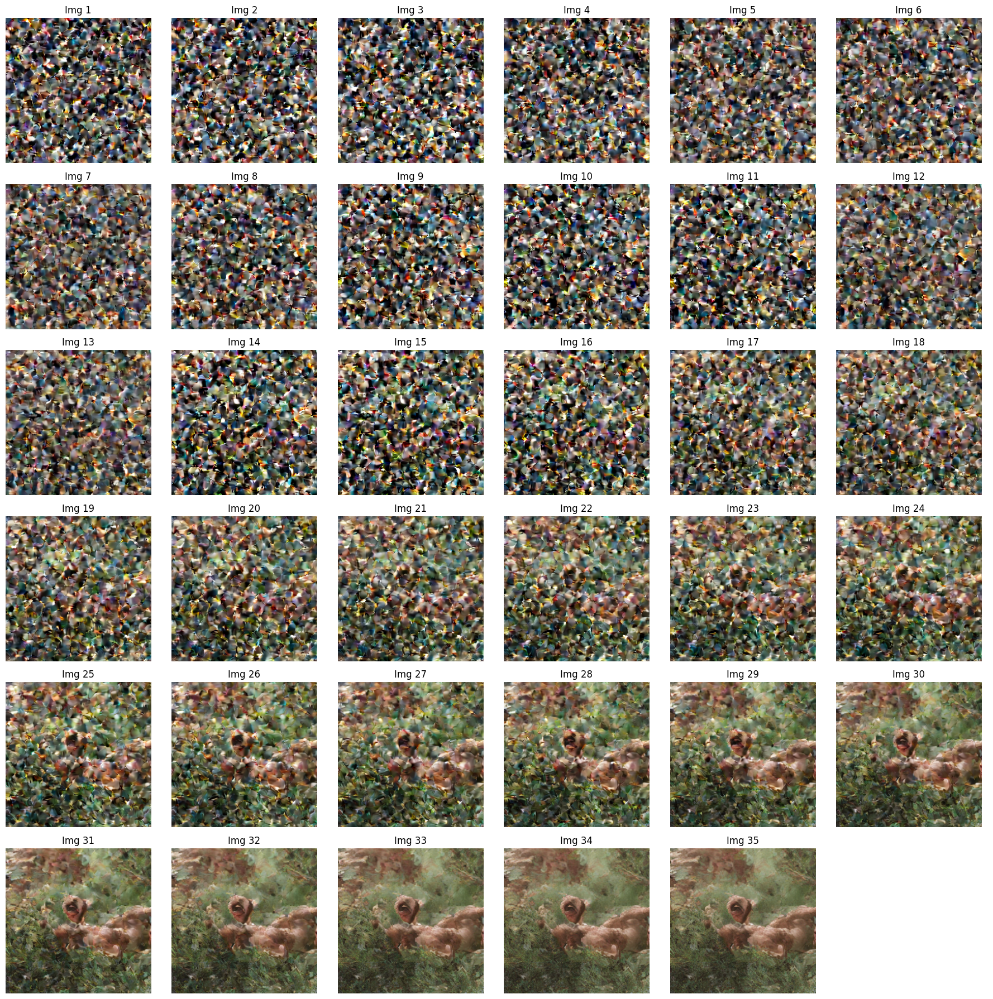

In [11]:
import math
def show_imgs_grid(imgs):
    num_imgs = len(imgs)
    filas = math.ceil(math.sqrt(num_imgs))
    columnas = math.ceil(num_imgs / filas)
    
    # Crear la figura y los ejes
    fig, axes = plt.subplots(filas, columnas, figsize=(columnas * 3, filas * 3))
    axes = axes.flatten()

    for i in range(len(axes)):
        if i < num_imgs:
            axes[i].imshow(imgs[i])
            axes[i].set_title(f'Img {i + 1}')
        else:
            # Si hay más ejes que imágenes, ocultar los ejes adicionales
            axes[i].axis('off')
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

show_imgs_grid(list_imgs)